In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as mlt
import seaborn as sns
from sklearn.model_selection import train_test_split
from math import sqrt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

In [2]:
df = pd.read_csv('Chennai houseing sale.csv')
df.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,P03210,Karapakkam,1004,04-05-2011,131,1.0,1.0,3,AbNormal,Yes,...,AllPub,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000
1,P09411,Anna Nagar,1986,19-12-2006,26,2.0,1.0,5,AbNormal,No,...,AllPub,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770
2,P01812,Adyar,909,04-02-2012,70,1.0,1.0,3,AbNormal,Yes,...,ELO,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200
3,P05346,Velachery,1855,13-03-2010,14,3.0,2.0,5,Family,No,...,NoSewr,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290
4,P06210,Karapakkam,1226,05-10-2009,84,1.0,1.0,3,AbNormal,Yes,...,AllPub,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PRT_ID         7109 non-null   object 
 1   AREA           7109 non-null   object 
 2   INT_SQFT       7109 non-null   int64  
 3   DATE_SALE      7109 non-null   object 
 4   DIST_MAINROAD  7109 non-null   int64  
 5   N_BEDROOM      7108 non-null   float64
 6   N_BATHROOM     7104 non-null   float64
 7   N_ROOM         7109 non-null   int64  
 8   SALE_COND      7109 non-null   object 
 9   PARK_FACIL     7109 non-null   object 
 10  DATE_BUILD     7109 non-null   object 
 11  BUILDTYPE      7109 non-null   object 
 12  UTILITY_AVAIL  7109 non-null   object 
 13  STREET         7109 non-null   object 
 14  MZZONE         7109 non-null   object 
 15  QS_ROOMS       7109 non-null   float64
 16  QS_BATHROOM    7109 non-null   float64
 17  QS_BEDROOM     7109 non-null   float64
 18  QS_OVERA

In [4]:
df.shape

(7109, 22)

In [5]:
df.describe()

,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
count,7109.000000,7109.000000,7108.000000,7104.000000,7109.000000,7109.000000,7109.000000,7109.000000,7061.000000,7109.000000,7109.000000,7.109000e+03
mean,1382.073006,99.603179,1.637029,1.213260,3.688704,3.517471,3.507244,3.485300,3.503254,376938.330708,141005.726544,1.089491e+07
std,457.410902,57.403110,0.802902,0.409639,1.019099,0.891972,0.897834,0.887266,0.527223,143070.662010,78768.093718,3.768603e+06
min,500.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,71177.000000,5055.000000,2.156875e+06
25%,993.000000,50.000000,1.000000,1.000000,3.000000,2.700000,2.700000,2.700000,3.130000,272406.000000,84219.000000,8.272100e+06
50%,1373.000000,99.000000,1.000000,1.000000,4.000000,3.500000,3.500000,3.500000,3.500000,349486.000000,127628.000000,1.033505e+07
75%,1744.000000,148.000000,2.000000,1.000000,4.000000,4.300000,4.300000,4.300000,3.890000,451562.000000,184506.000000,1.299390e+07
max,2500.000000,200.000000,4.000000,2.000000,6.000000,5.000000,5.000000,5.000000,4.970000,983922.000000,495405.000000,2.366734e+07


In [6]:
df.isnull().sum()

PRT_ID            0
AREA              0
INT_SQFT          0
DATE_SALE         0
DIST_MAINROAD     0
N_BEDROOM         1
N_BATHROOM        5
N_ROOM            0
SALE_COND         0
PARK_FACIL        0
DATE_BUILD        0
BUILDTYPE         0
UTILITY_AVAIL     0
STREET            0
MZZONE            0
QS_ROOMS          0
QS_BATHROOM       0
QS_BEDROOM        0
QS_OVERALL       48
REG_FEE           0
COMMIS            0
SALES_PRICE       0
dtype: int64

In [7]:
s = df.isnull()

<AxesSubplot:>

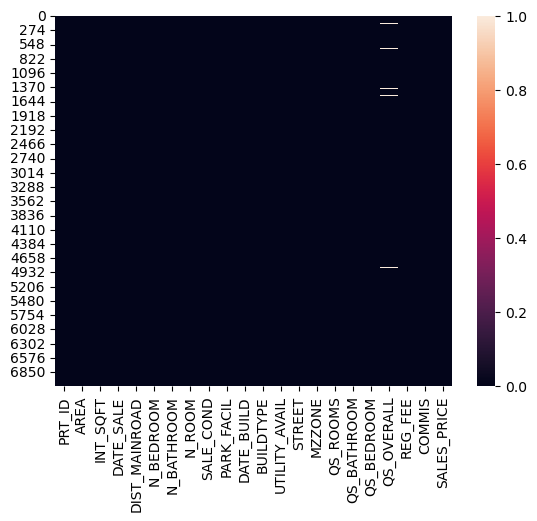

In [8]:
sns.heatmap(s)

In [9]:
# lets see the unique values of columns
for col in df.columns:
    if df[col].dtype=='object':
        print()
        print(col)
        print(df[col].unique())


PRT_ID
['P03210' 'P09411' 'P01812' ... 'P09594' 'P06508' 'P09794']

AREA
['Karapakkam' 'Anna Nagar' 'Adyar' 'Velachery' 'Chrompet' 'KK Nagar'
 'TNagar' 'T Nagar' 'Chrompt' 'Chrmpet' 'Karapakam' 'Ana Nagar' 'Chormpet'
 'Adyr' 'Velchery' 'Ann Nagar' 'KKNagar']

DATE_SALE
['04-05-2011' '19-12-2006' '04-02-2012' ... '28-03-2014' '25-08-2006'
 '13-07-2005']

SALE_COND
['AbNormal' 'Family' 'Partial' 'AdjLand' 'Normal Sale' 'Ab Normal'
 'Partiall' 'Adj Land' 'PartiaLl']

PARK_FACIL
['Yes' 'No' 'Noo']

DATE_BUILD
['15-05-1967' '22-12-1995' '09-02-1992' ... '01-09-1978' '11-08-1977'
 '24-07-1961']

BUILDTYPE
['Commercial' 'Others' 'Other' 'House' 'Comercial']

UTILITY_AVAIL
['AllPub' 'ELO' 'NoSewr ' 'NoSeWa' 'All Pub']

STREET
['Paved' 'Gravel' 'No Access' 'Pavd' 'NoAccess']

MZZONE
['A' 'RH' 'RL' 'I' 'C' 'RM']


In [10]:
# Cleaning the Data 
df.AREA.replace(['Ana Nagar','Ann Nagar'],'Anna Nagar',inplace=True)
df.AREA.replace('Karapakkam','Karapakam',inplace=True)
df.AREA.replace(['Chrompt','Chrmpet','Chormpet'],'Chrompet',inplace=True)
df.AREA.replace('KKNagar','KK Nagar',inplace=True)
df.AREA.replace('TNagar','T Nagar',inplace=True)
df.AREA.replace('Adyr','Adyar',inplace=True)
df.AREA.replace('Velchery','Velachery',inplace=True)
df.BUILDTYPE.replace('Comercial','Commercial',inplace=True)
df.BUILDTYPE.replace('Other','Others',inplace=True)
df.UTILITY_AVAIL.replace('AllPub','All Pub',inplace=True)
df.UTILITY_AVAIL.replace('NoSewr','NoSeWa',inplace=True)
df.UTILITY_AVAIL.replace('NoSewr ','NoSeWa',inplace=True)
df.SALE_COND.replace('Ab Normal','AbNormal',inplace=True)
df.SALE_COND.replace(['PartiaLl','Partiall'],'Partial',inplace=True)
df.SALE_COND.replace('Adj Land','AdjLand',inplace=True)
df.PARK_FACIL.replace('Noo','No',inplace=True)
df.STREET.replace('Pavd','Paved',inplace=True)
df.STREET.replace('NoAccess','No Access',inplace=True)

<AxesSubplot:>

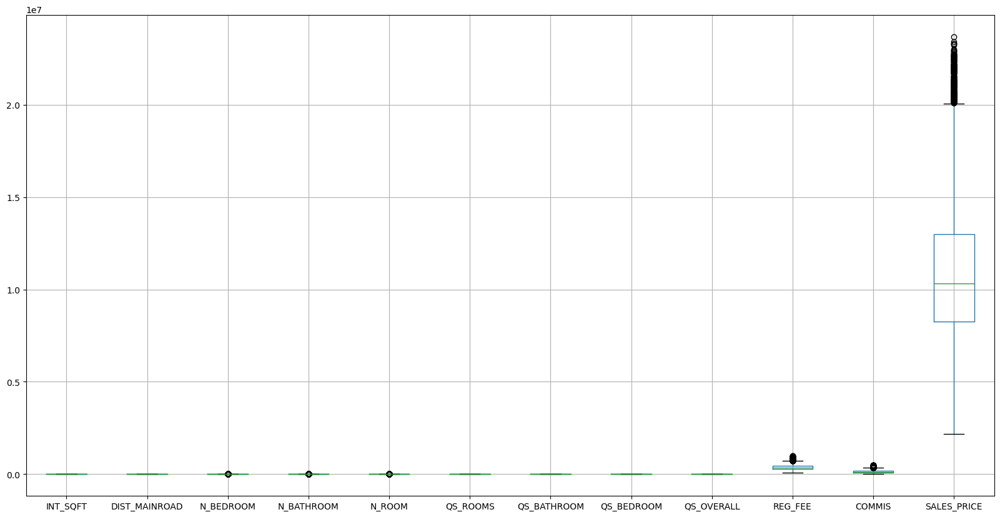

In [11]:
# To Find Outlier
mlt.figure(figsize=(20,10))
df.boxplot()

# EXPLORATORY DATA ANALYSIS

## Univariate Analysis

array([[<AxesSubplot:title={'center':'INT_SQFT'}>,
        <AxesSubplot:title={'center':'DIST_MAINROAD'}>,
        <AxesSubplot:title={'center':'N_BEDROOM'}>],
       [<AxesSubplot:title={'center':'N_BATHROOM'}>,
        <AxesSubplot:title={'center':'N_ROOM'}>,
        <AxesSubplot:title={'center':'QS_ROOMS'}>],
       [<AxesSubplot:title={'center':'QS_BATHROOM'}>,
        <AxesSubplot:title={'center':'QS_BEDROOM'}>,
        <AxesSubplot:title={'center':'QS_OVERALL'}>],
       [<AxesSubplot:title={'center':'REG_FEE'}>,
        <AxesSubplot:title={'center':'COMMIS'}>,
        <AxesSubplot:title={'center':'SALES_PRICE'}>]], dtype=object)

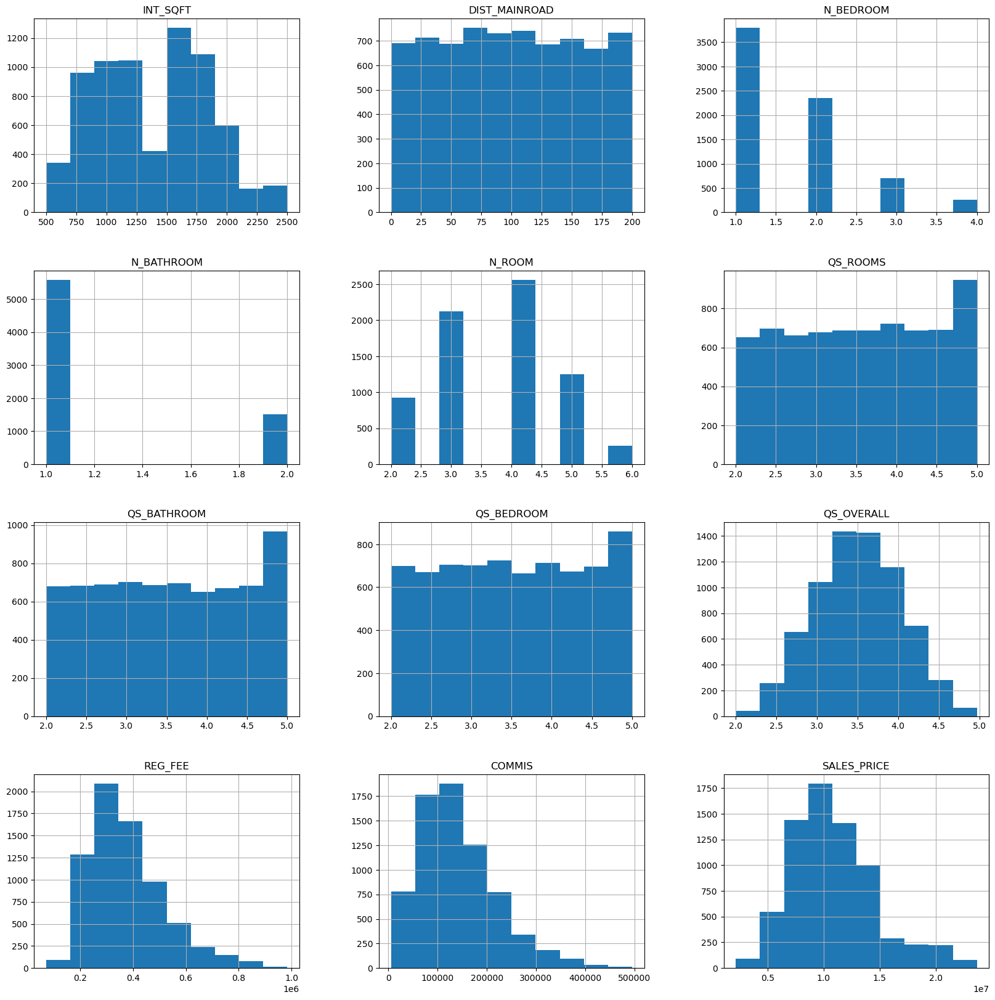

In [12]:
sale = df.copy()
sale.hist(figsize=(20,20))

## Bivariate Analysis

#### SALE PRICE VS AREA

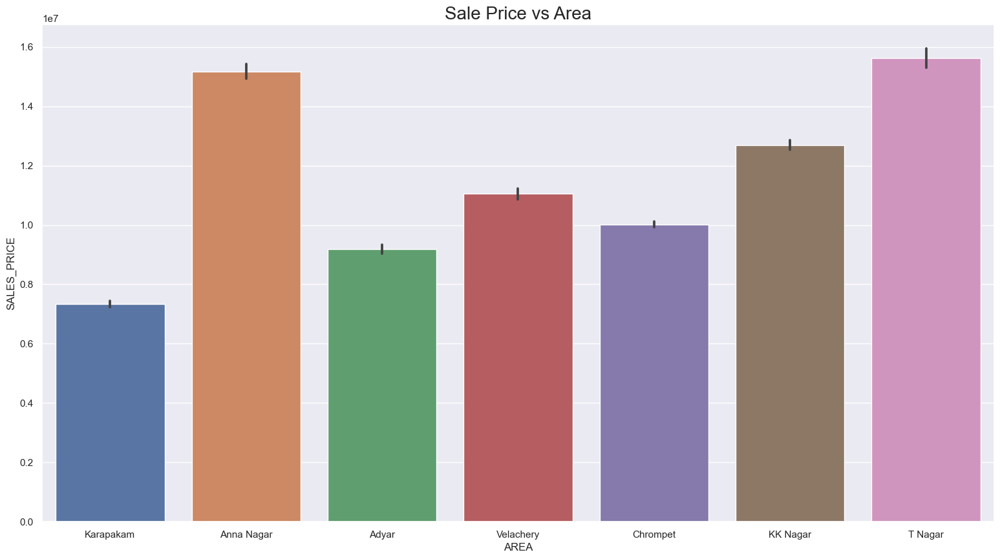

In [13]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "AREA", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs Area', fontsize=20)
mlt.show()

1. T Nagar and Anna Nagar Area Houses Has Maximum Sales Price and KK Nagar Area Houses are second Max Sales Price
2. Karapakam Area Houses has Less Sales Price When Compared to other Area Houses

#### SALE PRICE VS SQUARE FEET

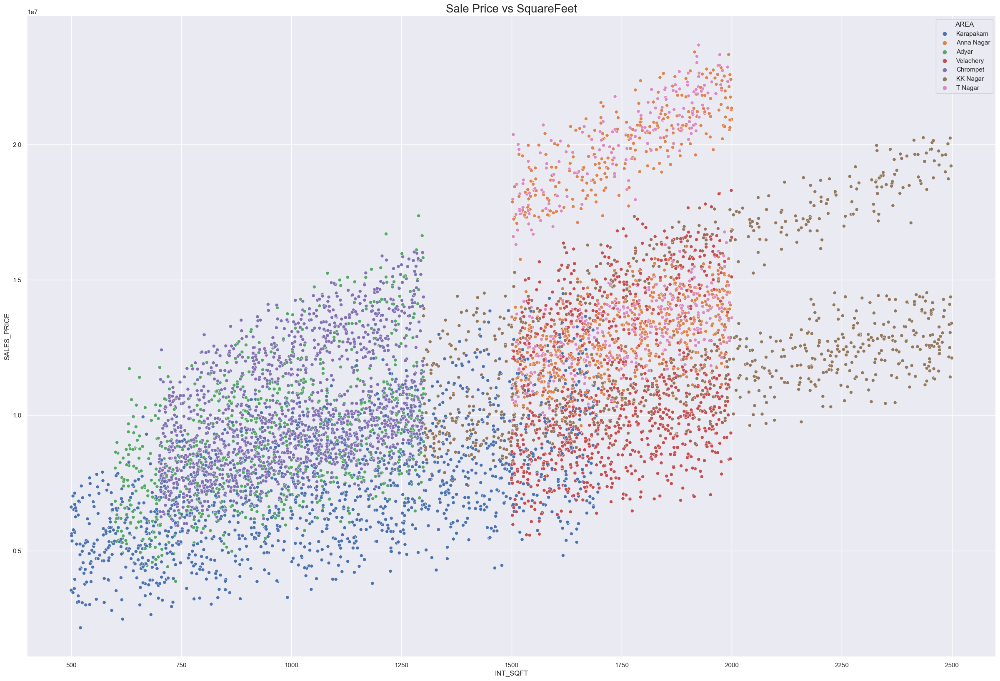

In [14]:
sns.set(rc = {'figure.figsize' : (30,20)})
sns.scatterplot(x= "INT_SQFT", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs SquareFeet', fontsize=20)
mlt.show()

1. Increase in Square Feet of Houses increases the Sales price of Houses
2. As we can see the Houses Related to Same Area Having Almost Similar Square feet Length
3. T Nagar and Anna Nagar Area Houses has Maximum Price Having Square Foot in the Range of 1500 to 2000
4. KK Nagar Area Houses Has high Square foots from 1400 to 2500

#### SALE PRICE VS DATE_SALE

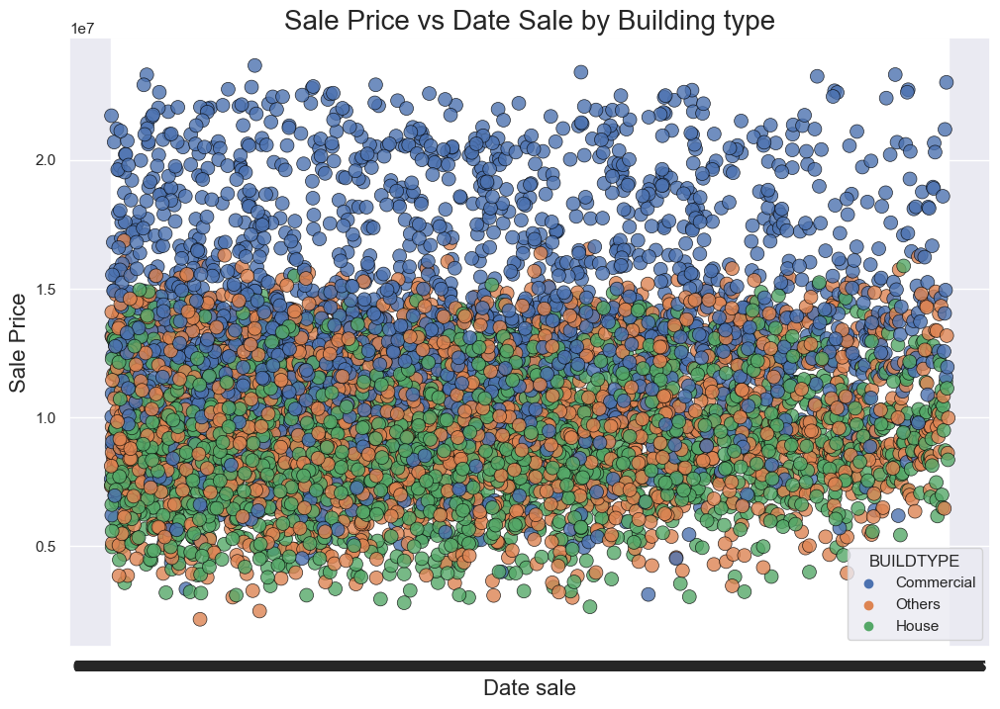

In [15]:
sns.set(rc = {'figure.figsize' : (12,8)})
sns.scatterplot(x="DATE_SALE", y="SALES_PRICE", hue='BUILDTYPE', data=sale, s=100, alpha=0.8, edgecolor='black', linewidth=0.5)
mlt.xlabel('Date sale', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs Date Sale by Building type', fontsize=20)
mlt.show()

#### SALE PRICE VS DIST_MAINROAD

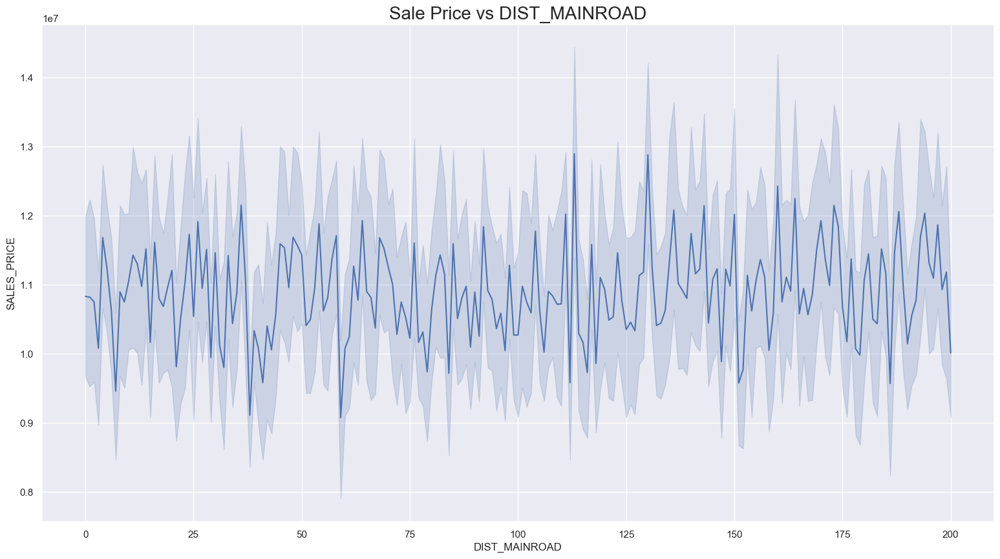

In [16]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.lineplot(x= "DIST_MAINROAD", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs DIST_MAINROAD', fontsize=20)
mlt.show()

1. It Seems Like MainRoad Distance Does Not Affecting the Sales Price of Houses
2. The Price is same for the Houses having shorter Main Road Distance and Larger Main Road Distance
3. So the Main Road Distance is Not influencing More on Sales Price

#### SALE PRICE VS N_BEDROOM

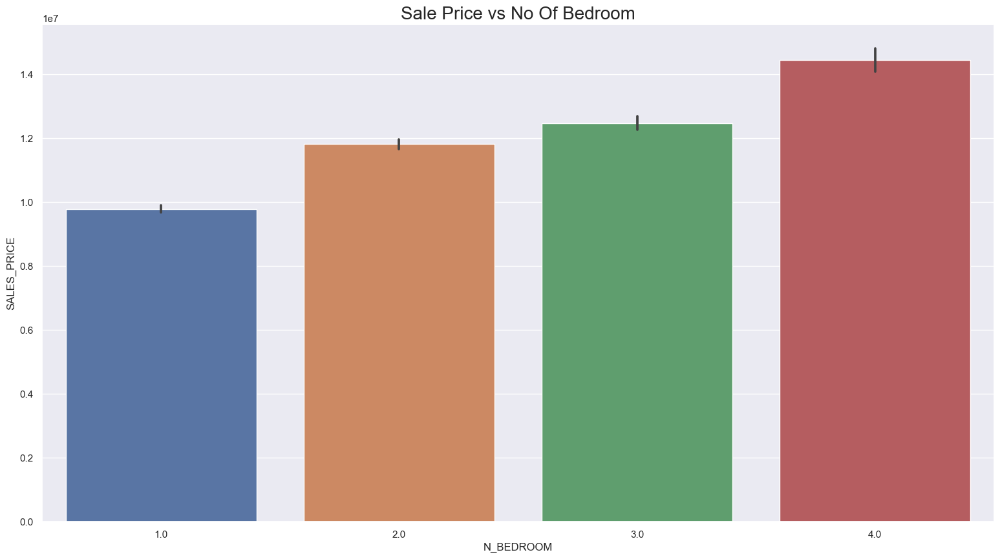

In [17]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "N_BEDROOM", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs No Of Bedroom', fontsize=20)
mlt.show()

1. Increase in Bed Rooms Increases the Sales Price
2. Anna Nagar,T Nagar,Adyar,Karapakam and Chrompet Area Houses consists of one to two bedrooms but two bedroom houses has maximum sales price in these areas
3. KK Nagar Area Consists of Houses having one to four bedrooms and Sales price increases with increase in bedrooms.
4. Velacherry Area Houses Consists of two to three Bedrooms
5. Out of all Anna Nagar and T Nagar Area Houses with two Bedrooms has Maximum Sales Price

#### SALES PRICE VS N_BATHROOM

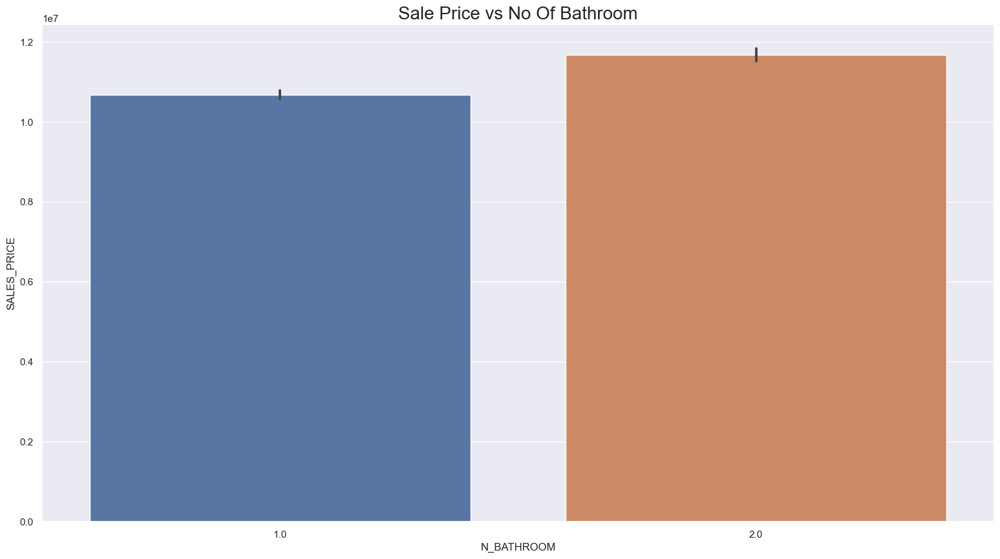

In [18]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "N_BATHROOM", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs No Of Bathroom', fontsize=20)
mlt.show()

1. Increase in Bathrooms Increases the Sales Price in all Areas
2. Anna Nagar and T Nagar Area houses Having only one Bathroom Has Maximum Sales Price when Compared to other Areas

#### SALES PRICE VS N_ROOM

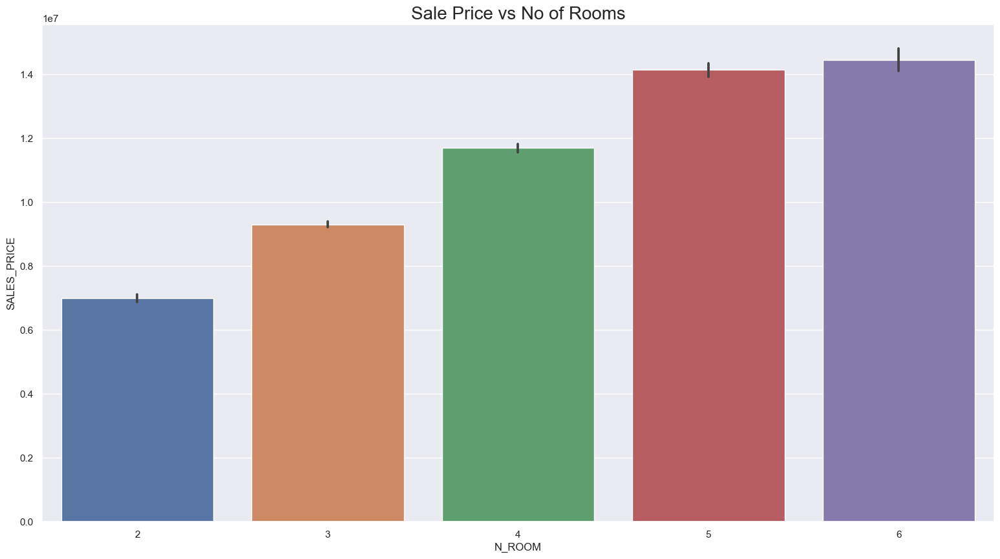

In [19]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "N_ROOM", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs No of Rooms', fontsize=20)
mlt.show()

1. As we can see increase in Rooms Count increases the Sales Price of Houses
2. Houses having total Four and Five Rooms in the areas of Anna Nagar,Velacherry,KK Nagar and T Nagar Has Maximum Sales Price
3. Karapakam,Adyar and Chrompet Area Houses having Two to Four Rooms but four room houses has maximum sales price when compared to others
4. Anna Nagar,Velacherry and T Nagar Areas consists of Four to Five Room Houses
5. KK Nagar Area Houses consists of Two to six Rooms and the price incresases with increase in the Room Count

#### SALE PRICE VS SALE CONDITION

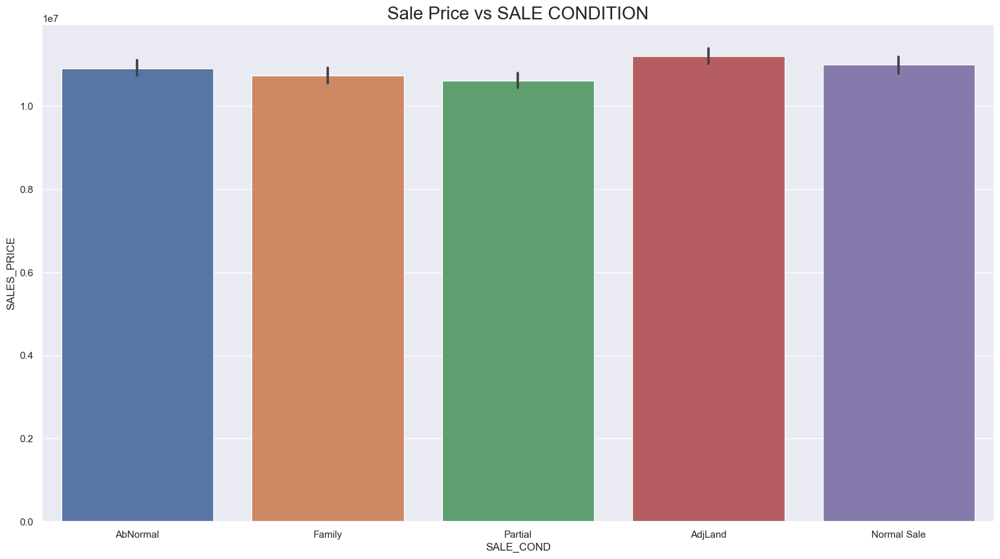

In [20]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "SALE_COND", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs SALE CONDITION', fontsize=20)
mlt.show()

1. Sales Price is Maximum for Normal, Family and AbNormal conditions of Sale

#### SALE PRICE VS PARKING FACILITY

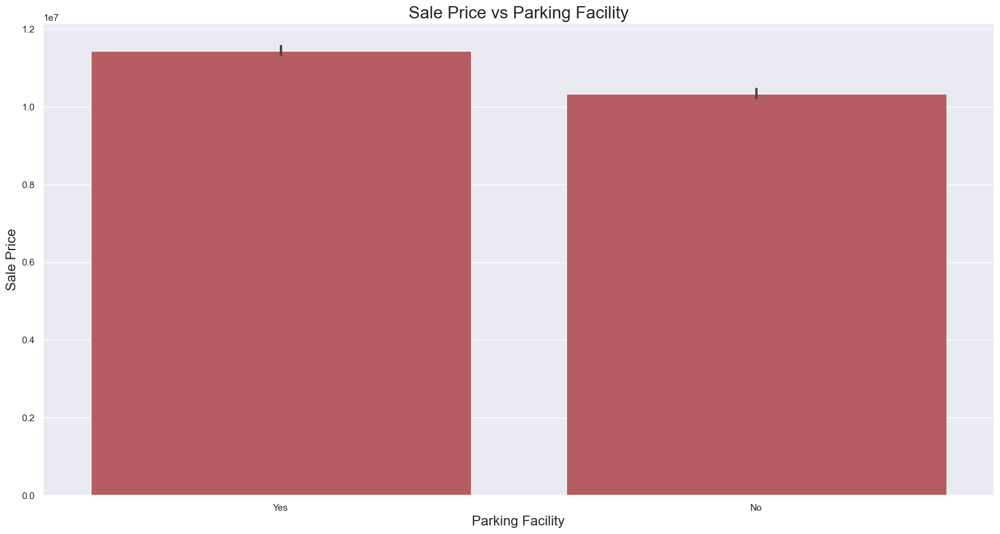

In [21]:
sns.set(rc = {'figure.figsize' : (20,10)})
sns.barplot(x= "PARK_FACIL", y = "SALES_PRICE", data = sale, color='r')
mlt.xlabel('Parking Facility', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs Parking Facility', fontsize=20)
mlt.show()

1. Houses with parking facilities have a higher sales price compared to those without.

#### SALE PRICE VS DATE BUILD

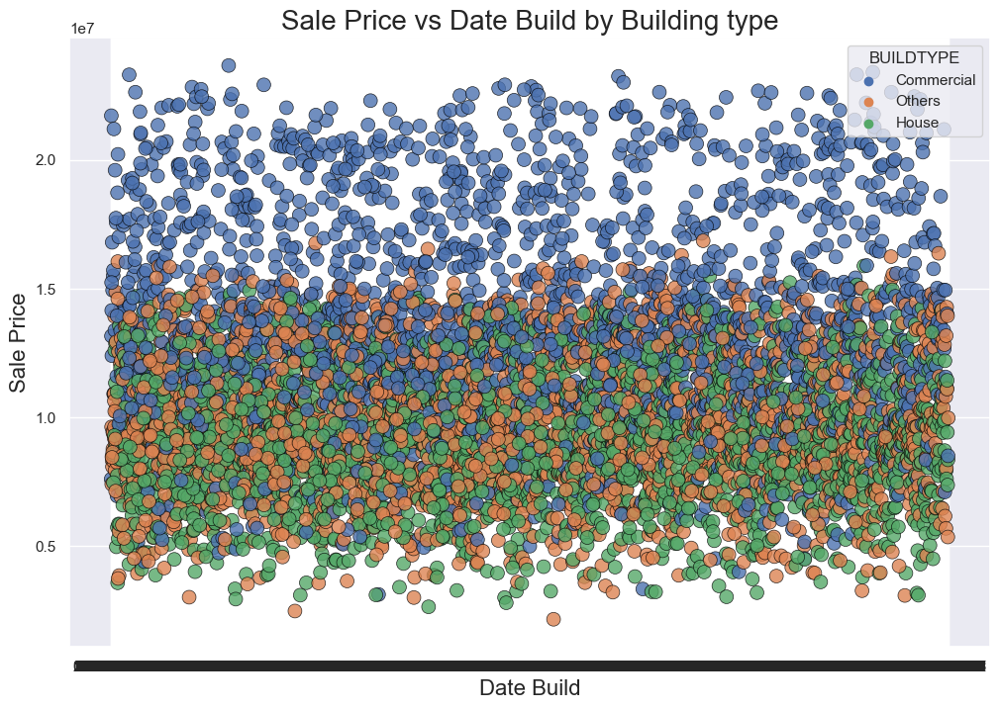

In [22]:
sns.set(rc = {'figure.figsize' : (12,8)})
sns.scatterplot(x="DATE_BUILD", y="SALES_PRICE", hue='BUILDTYPE', data=sale, s=100, alpha=0.8, edgecolor='black', linewidth=0.5)
mlt.xlabel('Date Build', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs Date Build by Building type', fontsize=20)
mlt.show()

1. The date of construction is not a determining factor in the sales price of commercial buildings.

#### SALE PRICE VS BUILDING TYPE

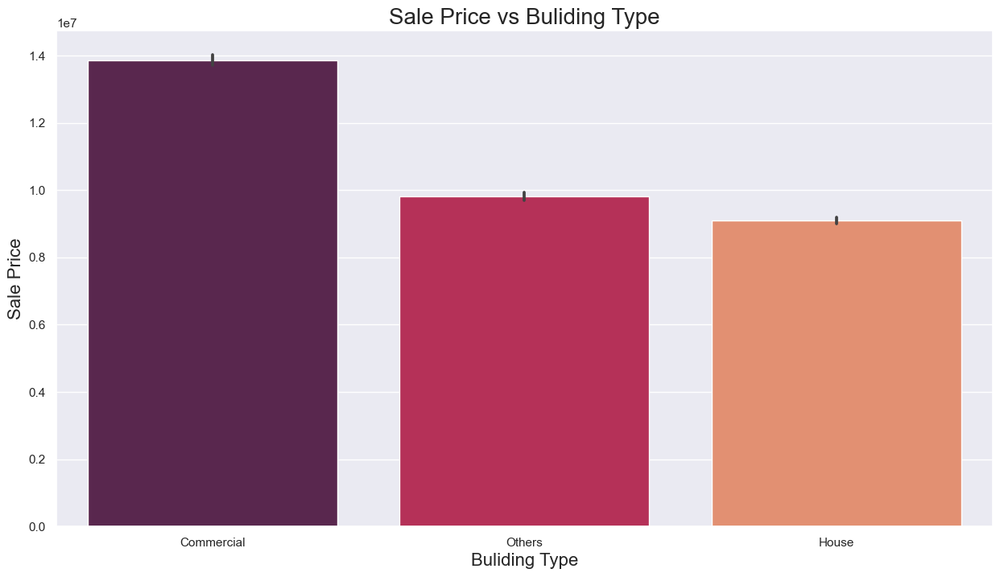

In [23]:
mlt.figure(figsize=(15,8))
sns.barplot(x= "BUILDTYPE", y = "SALES_PRICE", data = sale, palette='rocket')
mlt.xlabel('Buliding Type', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs Buliding Type', fontsize=20)
mlt.show()

1. Commercial buildings generally command higher sales prices compared to other types of buildings

#### SALE PRICE VS UTILITY AVAILABLE

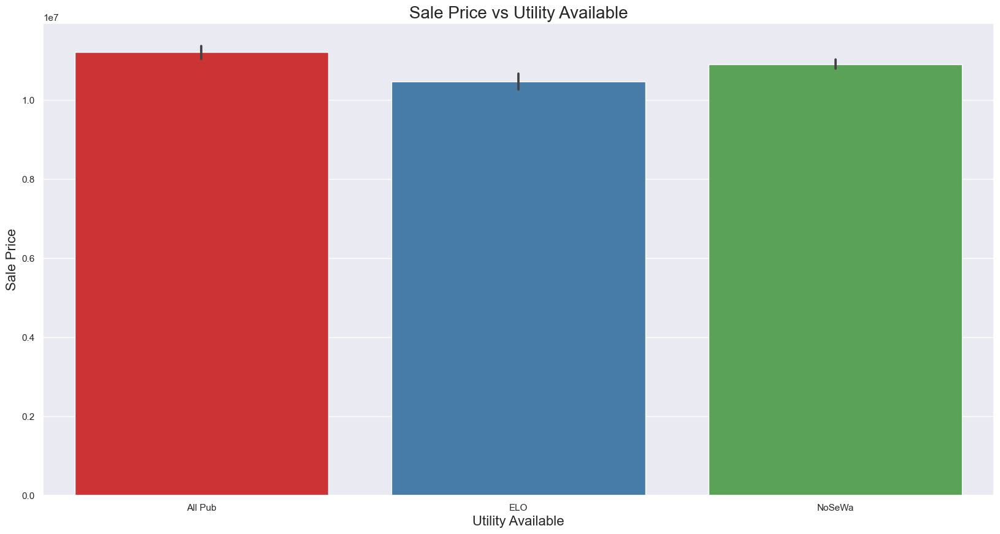

In [24]:
sns.set(rc = {'figure.figsize' : (20,10)})
sns.barplot(x= "UTILITY_AVAIL", y = "SALES_PRICE", data = sale, palette='Set1')
mlt.xlabel('Utility Available', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs Utility Available', fontsize=20)
mlt.show()

1. Access to all public utilities, including water, electricity, gas, and sewage, significantly increases the demand and sales price of houses.

#### SALE PRICE VS STREET

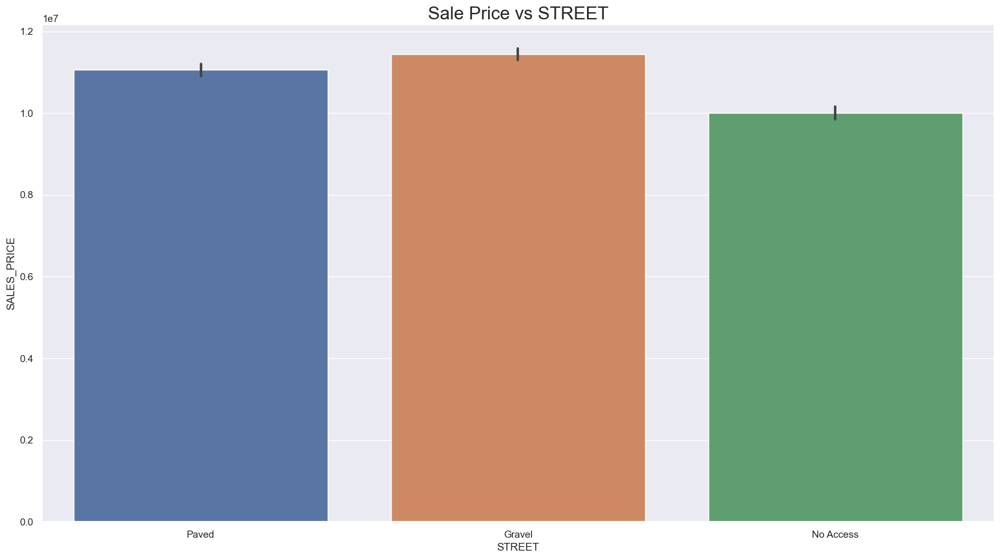

In [25]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.barplot(x= "STREET", y = "SALES_PRICE", data = sale)
mlt.title('Sale Price vs STREET', fontsize=20)
mlt.show()

1. The Sales prices in paved, gravel and no access remains almost the same.
2. The gravelled road has slightly more price, while the no access has slightly less price
3. It implies the street doesn't really affect the sales price

#### SALE PRICE VS MZZONE

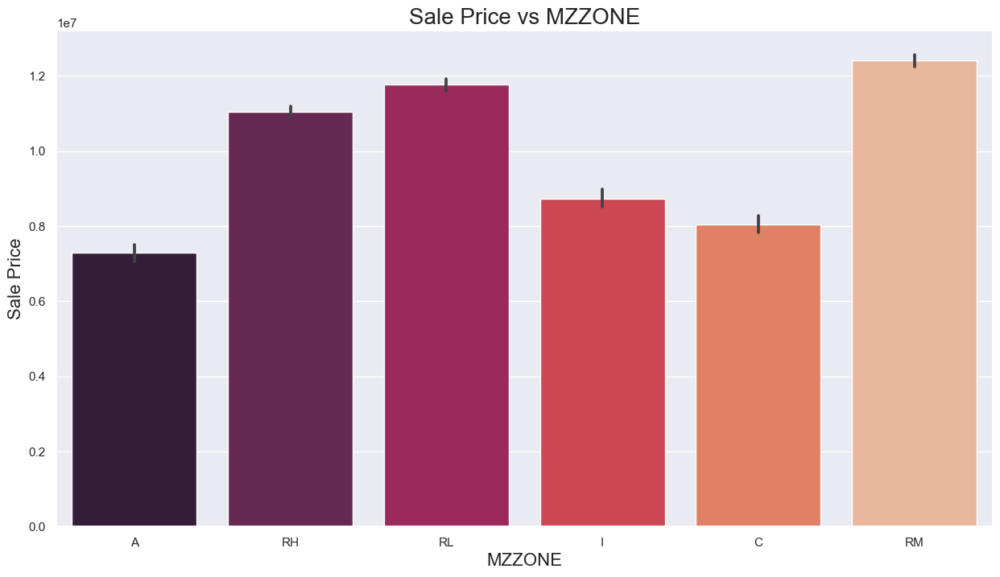

In [26]:
mlt.figure(figsize=(15,8))
sns.barplot(x= "MZZONE", y = "SALES_PRICE", data = sale, palette='rocket')
mlt.xlabel('MZZONE', fontsize=16)
mlt.ylabel('Sale Price', fontsize=16)
mlt.title('Sale Price vs MZZONE', fontsize=20)
mlt.show()

1. Sales Price is highest for Residential Medium Density followed by Residential Low Density and Residential High Density
2. Sales price is lowest for Agricultural land
3. It implies that residential areas are preferred mostly by customers 

#### SALE PRICE VS QS_ROOMS

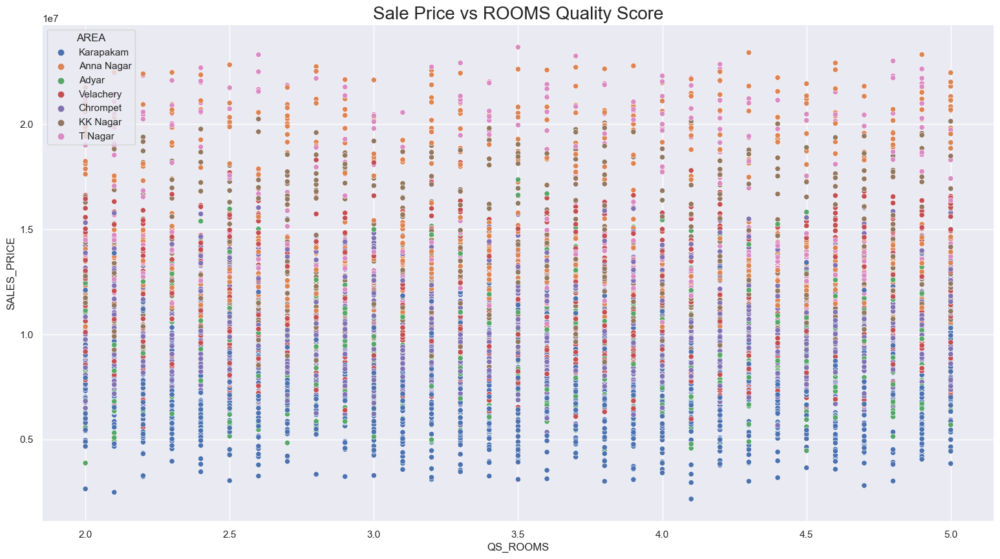

In [27]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "QS_ROOMS", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs ROOMS Quality Score', fontsize=20)
mlt.show()

1. It Seems Like QS_Room Does Not Affecting the Sales Price of Houses
2. The Price is same for the Houses having high Room QS and low Room QS
3. So the Room Quality Score is Not influencing More on Sales Price

#### SALE PRICE VS QS_BATHROOM

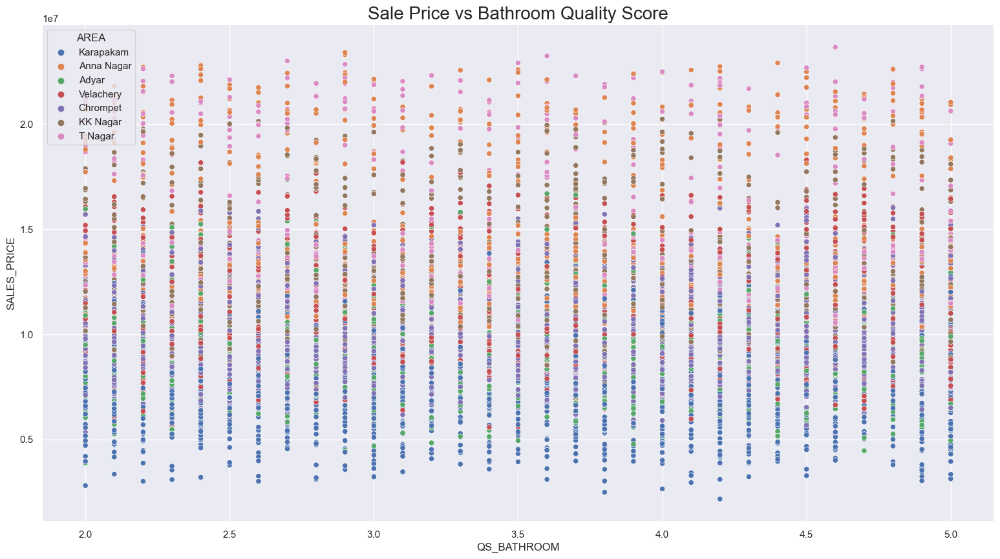

In [28]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "QS_BATHROOM", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs Bathroom Quality Score', fontsize=20)
mlt.show()

1. It Seems Like QS_Bathroom Does Not Affecting the Sales Price of Houses
2. The Price is same for the Houses having high Bathroom QS and low Bathroom QS
3. So the Bathroom Quality Score is Not influencing More on Sales Price

#### SALE PRICE VS QS_BEDROOM

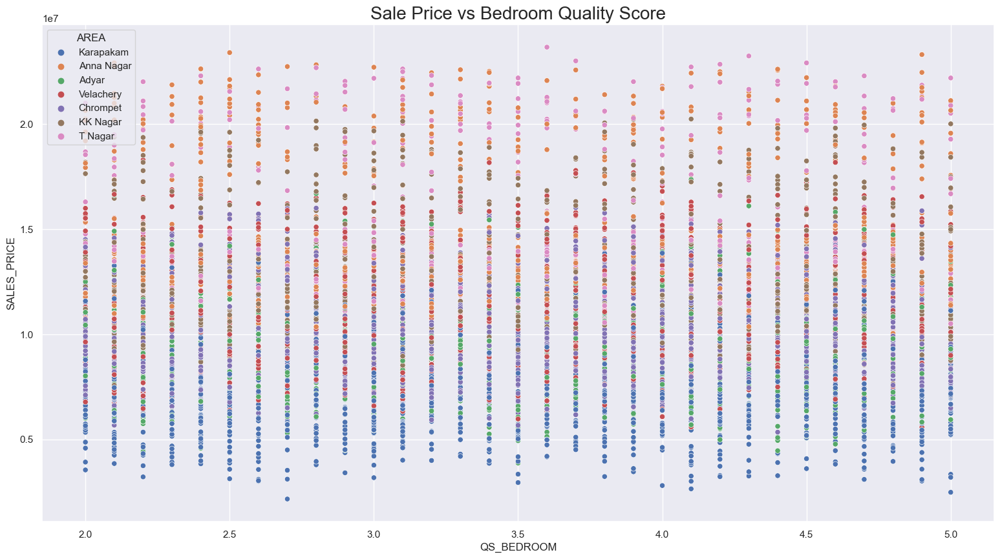

In [29]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "QS_BEDROOM", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs Bedroom Quality Score', fontsize=20)
mlt.show()

1. It Seems Like QS_Bedroom Does Not Affecting the Sales Price of Houses
2. The Price is same for the Houses having high QS_Bedroom and low QS_Bedroom
3. So the Bedroom Quality Score is Not influencing More on Sales Price

#### SALE PRICE VS QS_OVERALL

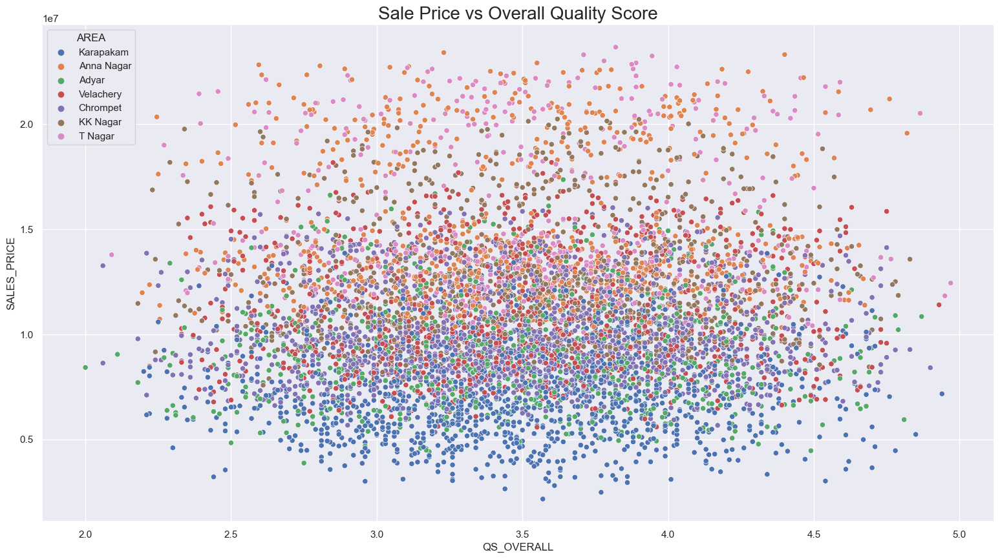

In [30]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "QS_OVERALL", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs Overall Quality Score', fontsize=20)
mlt.show()

1. It Seems Like QS_Overall Does Not Affecting the Sales Price of Houses
2. The Price is same for the Houses having high Overall QS and low Overall QS
3. So the Overall Quality Score is Not influencing More on Sales Price

#### SALE PRICE VS COMMISION FEE

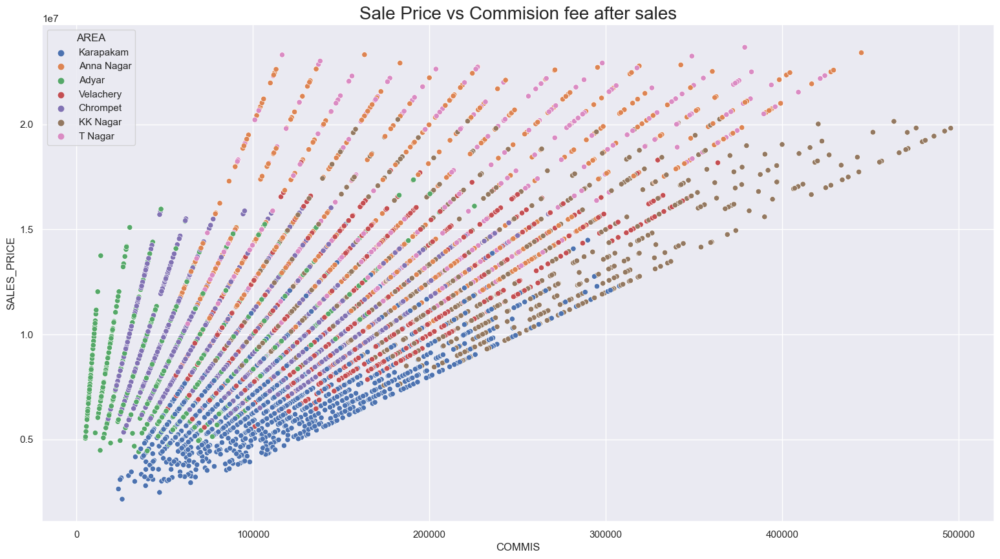

In [31]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "COMMIS", y = "SALES_PRICE",hue="AREA",data = sale)
mlt.title('Sale Price vs Commision fee after sales', fontsize=20)
mlt.show()

1. Increase in Sale price of Houses increases the Commision fee after sales
2. T Nagar and Anna Nagar Area Houses has Maximum Sale Price Having Commision fee in the Range of 70000 to 440000
3. KK Nagar Area Houses Has high commision fee from 70000 to 480000

#### SALE PRICE VS REGISTRATION FEE

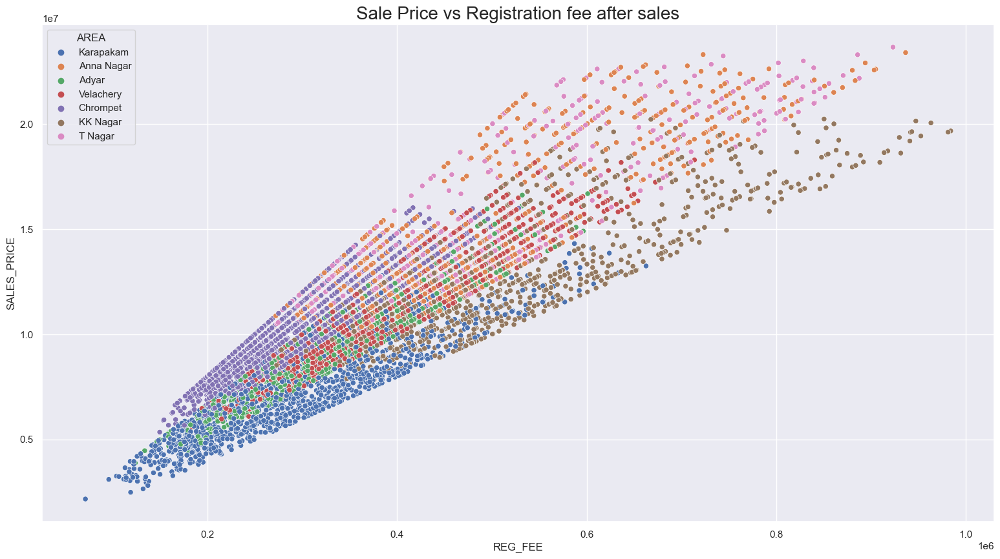

In [32]:
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(x= "REG_FEE", y = "SALES_PRICE",hue="AREA", data = sale)
mlt.title('Sale Price vs Registration fee after sales', fontsize=20)
mlt.show()

1. Increase in Sale price of Houses increases the Registration fee after sales
2. KK Nagar Area Houses Has high Registration fee 

#### SALE PRICE VS BUILDING AGE

In [33]:
import datetime

# convert the DATE_SALE and DATE_BUILD columns to datetime variables
df['DATE_SALE'] = pd.to_datetime(df['DATE_SALE'], format='%d-%m-%Y')
df['DATE_BUILD'] = pd.to_datetime(df['DATE_BUILD'], format='%d-%m-%Y')

In [34]:
# calculate the building age in years and add a new column to the dataframe
df['BUILDING_AGE'] = (datetime.datetime.now() - df['DATE_BUILD']) / datetime.timedelta(days=365)

In [35]:
# print the first 5 rows of the dataframe to check the results
df.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE,BUILDING_AGE
0,P03210,Karapakam,1004,2011-05-04,131,1.0,1.0,3,AbNormal,Yes,...,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000,55.892285
1,P09411,Anna Nagar,1986,2006-12-19,26,2.0,1.0,5,AbNormal,No,...,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770,27.267628
2,P01812,Adyar,909,2012-02-04,70,1.0,1.0,3,AbNormal,Yes,...,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200,31.136121
3,P05346,Velachery,1855,2010-03-13,14,3.0,2.0,5,Family,No,...,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290,35.034751
4,P06210,Karapakam,1226,2009-10-05,84,1.0,1.0,3,AbNormal,Yes,...,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250,43.470368


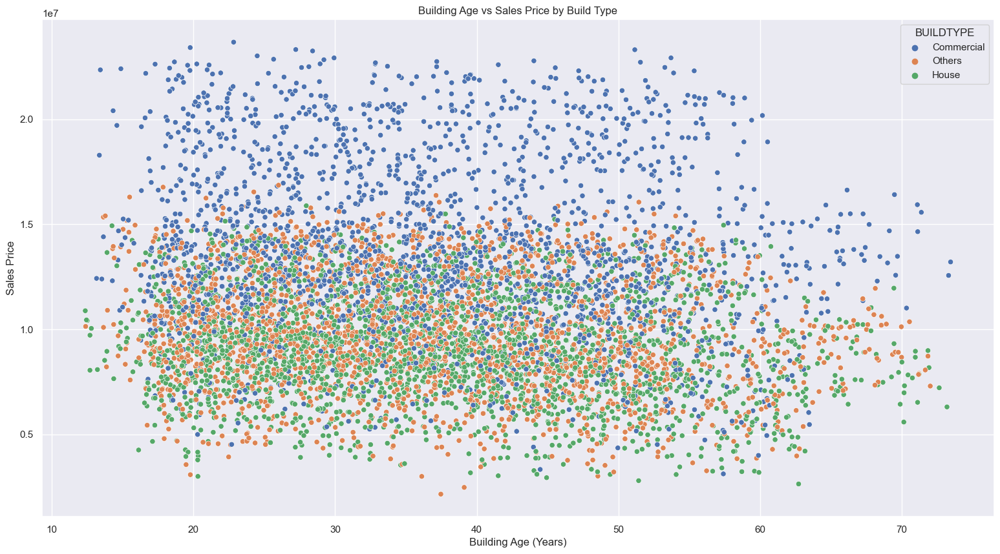

In [36]:
#Plotting the Relationship between Building Age and Sales Price
sns.set(rc = {'figure.figsize' : (19,10)})
sns.scatterplot(data=df, x='BUILDING_AGE', y='SALES_PRICE', hue='BUILDTYPE')
mlt.xlabel('Building Age (Years)')
mlt.ylabel('Sales Price')
mlt.title('Building Age vs Sales Price by Build Type')
mlt.show()

1. Sales price decreases when the age of the building is more than 60years.
2. Sales price is high during the period of 20-50 Years.
3. Sales price is identified higher for commercial buildings.

# DATA PREPROCESSING

## NaN Handling

In [37]:
df.isna().sum()

PRT_ID            0
AREA              0
INT_SQFT          0
DATE_SALE         0
DIST_MAINROAD     0
N_BEDROOM         1
N_BATHROOM        5
N_ROOM            0
SALE_COND         0
PARK_FACIL        0
DATE_BUILD        0
BUILDTYPE         0
UTILITY_AVAIL     0
STREET            0
MZZONE            0
QS_ROOMS          0
QS_BATHROOM       0
QS_BEDROOM        0
QS_OVERALL       48
REG_FEE           0
COMMIS            0
SALES_PRICE       0
BUILDING_AGE      0
dtype: int64

In [38]:
# Replacing the Null Values with median values of the data using Simple Imputer
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(missing_values=np.nan,strategy='median',fill_value=None)
df['N_BEDROOM']=imputer.fit_transform(df[['N_BEDROOM']])
df['N_BATHROOM']=imputer.fit_transform(df[['N_BATHROOM']])
df['QS_OVERALL']=imputer.fit_transform(df[['QS_OVERALL']])

In [39]:
#Changing the datatype from float to int
df.QS_ROOMS=df.QS_ROOMS.astype(int)
df.QS_BATHROOM=df.QS_BATHROOM.astype(int)
df.QS_BEDROOM=df.QS_BEDROOM.astype(int)
df.QS_OVERALL=df.QS_OVERALL.astype(int)
df.N_BEDROOM=df.N_BEDROOM.astype(int)
df.N_BATHROOM=df.N_BATHROOM.astype(int)

In [40]:
df.isna().sum()

PRT_ID           0
AREA             0
INT_SQFT         0
DATE_SALE        0
DIST_MAINROAD    0
N_BEDROOM        0
N_BATHROOM       0
N_ROOM           0
SALE_COND        0
PARK_FACIL       0
DATE_BUILD       0
BUILDTYPE        0
UTILITY_AVAIL    0
STREET           0
MZZONE           0
QS_ROOMS         0
QS_BATHROOM      0
QS_BEDROOM       0
QS_OVERALL       0
REG_FEE          0
COMMIS           0
SALES_PRICE      0
BUILDING_AGE     0
dtype: int64

<AxesSubplot:>

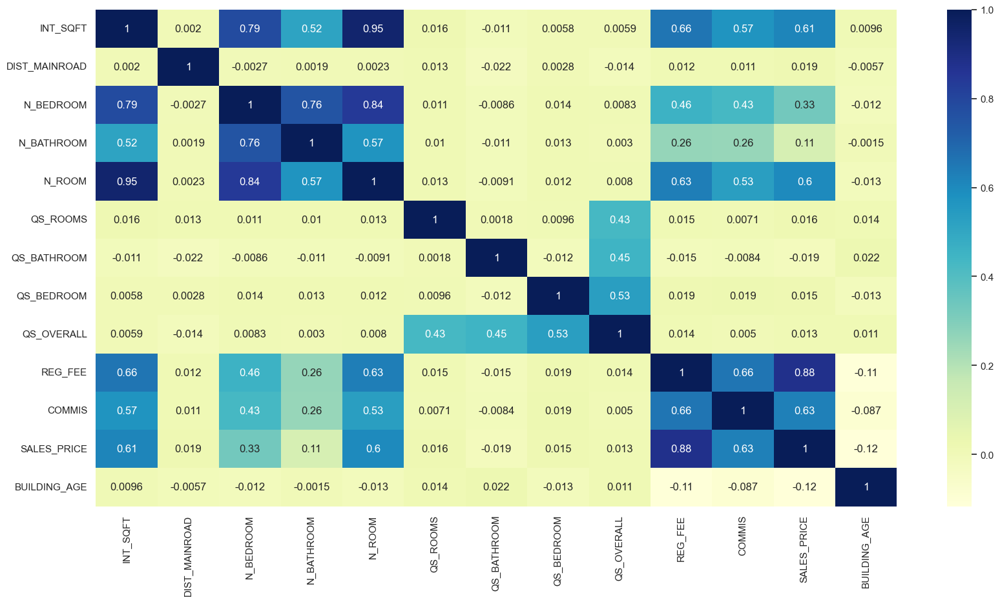

In [41]:
corr_matrix=df.corr()
mlt.subplots(figsize = (20,10))
sns.heatmap(corr_matrix,annot=True,cmap='YlGnBu')

## Handling Outliers

<AxesSubplot:>

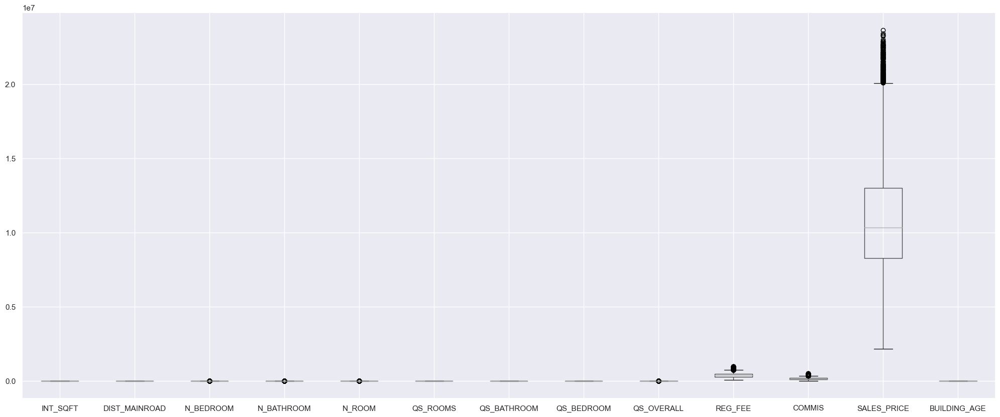

In [42]:
mlt.figure(figsize=(25,10))
df.boxplot()

In [43]:
for i in ['N_BEDROOM','N_BATHROOM','N_ROOM','QS_OVERALL']:
    print(i)
    Q1=np.percentile(df[i],25,interpolation='midpoint')
    Q2=np.percentile(df[i],50,interpolation='midpoint')
    Q3=np.percentile(df[i],75,interpolation='midpoint')
    print(Q1, Q2, Q3)

    IQR=Q3-Q1
    print(IQR)   

    low_limit=Q1-1.5*IQR
    upp_limit=Q3+1.5*IQR
    print('LOWER LIMIT = ',low_limit)
    print('UPPER LIMIT = ',upp_limit)

    drop_index = df[(df[i] < low_limit) | (df[i] > upp_limit)].index
    df.drop(drop_index,inplace=True)
df 

N_BEDROOM
1.0 1.0 2.0
1.0
LOWER LIMIT =  -0.5
UPPER LIMIT =  3.5
N_BATHROOM
1.0 1.0 1.0
0.0
LOWER LIMIT =  1.0
UPPER LIMIT =  1.0
N_ROOM
3.0 3.0 4.0
1.0
LOWER LIMIT =  1.5
UPPER LIMIT =  5.5
QS_OVERALL
3.0 3.0 3.0
0.0
LOWER LIMIT =  3.0
UPPER LIMIT =  3.0


,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,...,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE,BUILDING_AGE
1,P09411,Anna Nagar,1986,2006-12-19,26,2,1,5,AbNormal,No,...,Gravel,RH,4,4,2,3,760122,304049,21717770,27.267628
2,P01812,Adyar,909,2012-02-04,70,1,1,3,AbNormal,Yes,...,Gravel,RL,4,3,2,3,421094,92114,13159200,31.136121
4,P06210,Karapakam,1226,2009-10-05,84,1,1,3,AbNormal,Yes,...,Gravel,C,3,2,4,3,237000,74063,7406250,43.470368
5,P00219,Chrompet,1220,2014-09-11,36,2,1,4,Partial,No,...,No Access,RH,4,2,3,3,409027,198316,12394750,13.533381
8,P03377,Chrompet,771,2011-04-06,175,1,1,2,AdjLand,No,...,Paved,RM,2,3,4,3,257578,33236,8308970,45.968998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7096,P03146,Chrompet,1275,2011-05-18,3,2,1,4,AbNormal,No,...,Gravel,RL,3,3,4,3,287798,86339,9593250,34.853929
7097,P05670,Anna Nagar,1860,2010-01-15,174,2,1,5,AbNormal,No,...,Gravel,RH,4,3,3,3,522119,70557,14111320,19.190916
7098,P00629,Anna Nagar,1611,2013-11-21,144,1,1,4,Partial,Yes,...,Paved,RM,3,3,2,3,432288,209172,13944780,14.338861
7101,P05042,Karapakam,666,2010-05-11,51,1,1,2,AdjLand,Yes,...,Gravel,I,3,4,2,3,273317,74541,6211750,48.873107


<AxesSubplot:>

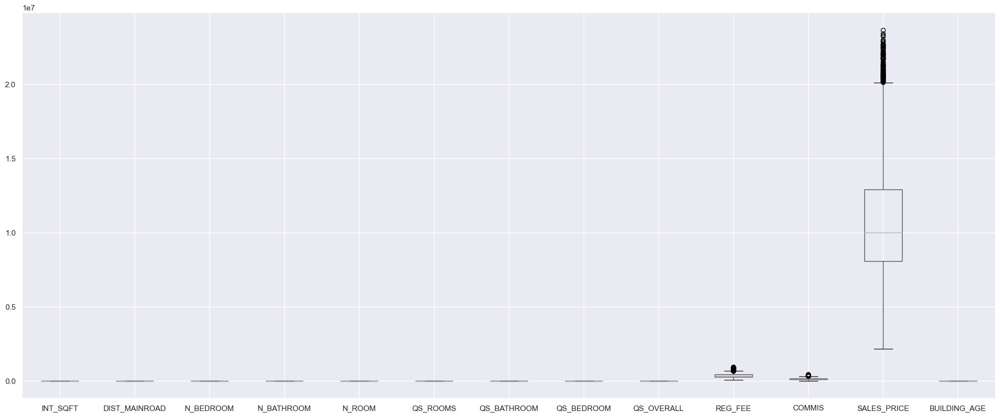

In [44]:
mlt.figure(figsize=(25,10))
df.boxplot()

C:\Users\hp\AppData\Local\Temp\ipykernel_10616\2461302863.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('log_REG_FEE', axis=1, inplace=True)


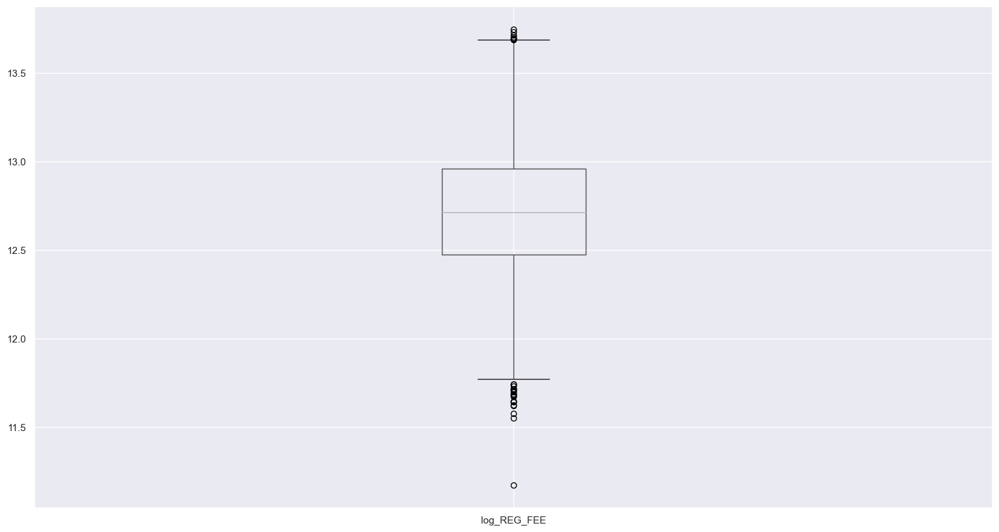

In [45]:
# Take the logarithm of the target variable 
df['log_REG_FEE'] = np.log(df['REG_FEE'])

# Create a boxplot of the log-transformed 
df.boxplot(column='log_REG_FEE')

# Calculate the upper and lower bounds using the interquartile range
Q1 = df['log_REG_FEE'].quantile(0.25)
Q3 = df['log_REG_FEE'].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5*IQR
lower_bound = Q1 - 1.5*IQR

# Filter the dataframe to remove outliers
df = df[(df['log_REG_FEE'] > lower_bound) & (df['log_REG_FEE'] < upper_bound)]

# Remove the log_price column
df.drop('log_REG_FEE', axis=1, inplace=True)


C:\Users\hp\AppData\Local\Temp\ipykernel_10616\248121680.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['log_COMMIS'] = np.log(df['COMMIS'])


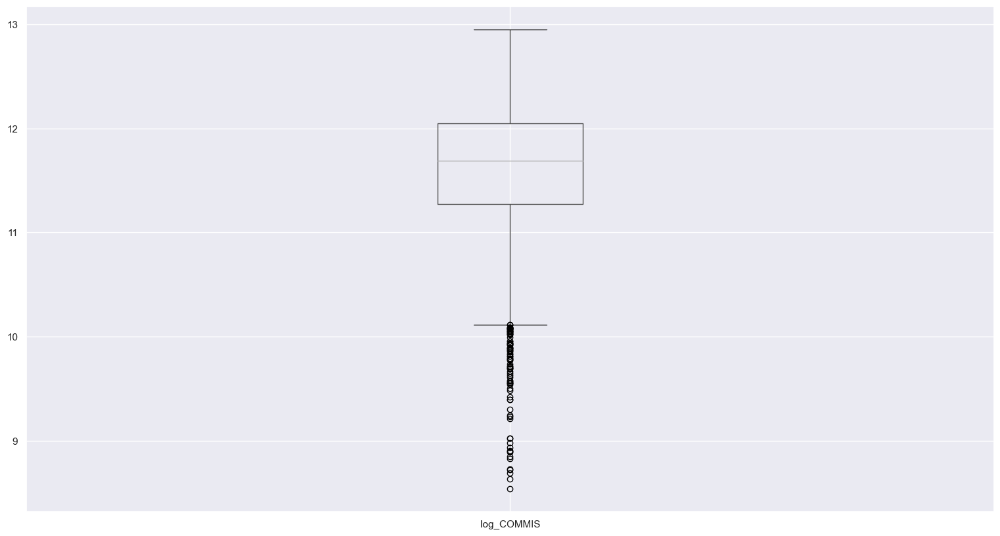

In [46]:
# Take the logarithm of the target variable
df['log_COMMIS'] = np.log(df['COMMIS'])

# Create a boxplot of the log-transformed 
df.boxplot(column='log_COMMIS')

# Calculate the upper and lower bounds using the interquartile range
Q1 = df['log_COMMIS'].quantile(0.25)
Q3 = df['log_COMMIS'].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5*IQR
lower_bound = Q1 - 1.5*IQR


# Filter the dataframe to remove outliers
df = df[(df['log_COMMIS'] > lower_bound) & (df['log_COMMIS'] < upper_bound)]

# Remove the log_price column
df.drop('log_COMMIS', axis=1, inplace=True)


## FEATURE REDUCTION

In [47]:
#Dropping unwanted columns
df=df.drop(['DATE_SALE','DATE_BUILD','QS_ROOMS','QS_BATHROOM','QS_BEDROOM','PRT_ID','QS_OVERALL','REG_FEE','COMMIS'],axis=1)
df

,AREA,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,SALES_PRICE,BUILDING_AGE
1,Anna Nagar,1986,26,2,1,5,AbNormal,No,Commercial,All Pub,Gravel,RH,21717770,27.267628
2,Adyar,909,70,1,1,3,AbNormal,Yes,Commercial,ELO,Gravel,RL,13159200,31.136121
4,Karapakam,1226,84,1,1,3,AbNormal,Yes,Others,All Pub,Gravel,C,7406250,43.470368
5,Chrompet,1220,36,2,1,4,Partial,No,Commercial,NoSeWa,No Access,RH,12394750,13.533381
8,Chrompet,771,175,1,1,2,AdjLand,No,Others,NoSeWa,Paved,RM,8308970,45.968998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7096,Chrompet,1275,3,2,1,4,AbNormal,No,House,ELO,Gravel,RL,9593250,34.853929
7097,Anna Nagar,1860,174,2,1,5,AbNormal,No,Others,All Pub,Gravel,RH,14111320,19.190916
7098,Anna Nagar,1611,144,1,1,4,Partial,Yes,Others,NoSeWa,Paved,RM,13944780,14.338861
7101,Karapakam,666,51,1,1,2,AdjLand,Yes,Others,ELO,Gravel,I,6211750,48.873107


<AxesSubplot:>

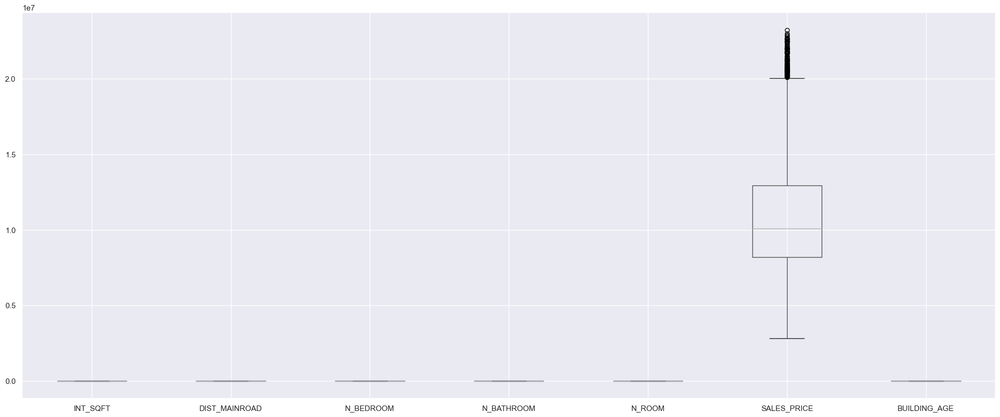

In [48]:
mlt.figure(figsize=(25,10))
df.boxplot()

## ENCODING

In [49]:
# Coverting the labels into a numeric form using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

In [50]:
df.head()

,AREA,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,SALES_PRICE,BUILDING_AGE
1,1,1986,26,2,1,5,0,0,0,0,0,3,21717770,27.267628
2,0,909,70,1,1,3,0,1,0,1,0,4,13159200,31.136121
4,4,1226,84,1,1,3,0,1,2,0,0,1,7406250,43.470368
5,2,1220,36,2,1,4,4,0,0,2,1,3,12394750,13.533381
8,2,771,175,1,1,2,1,0,2,2,2,5,8308970,45.968998


## FEATURE SCALING

In [51]:
x= df.drop('SALES_PRICE',axis=1)                 
y= df['SALES_PRICE']

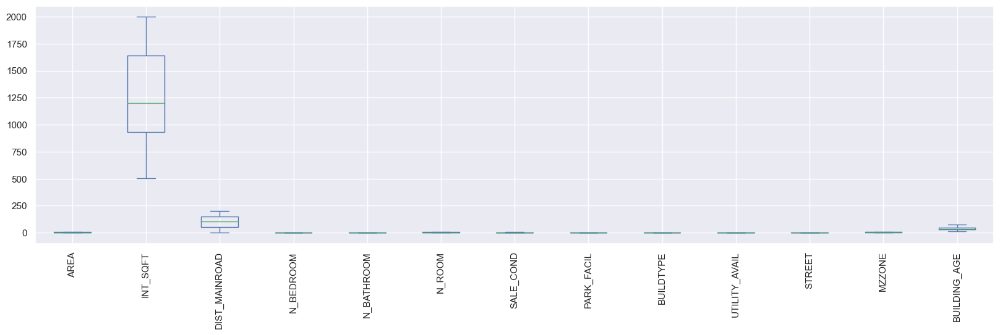

In [52]:
# Splitting and training our cleaned dataset
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)
pd.DataFrame(X_train, columns=X_train.columns).plot.box(figsize=(20,5), rot=90)
mlt.show()

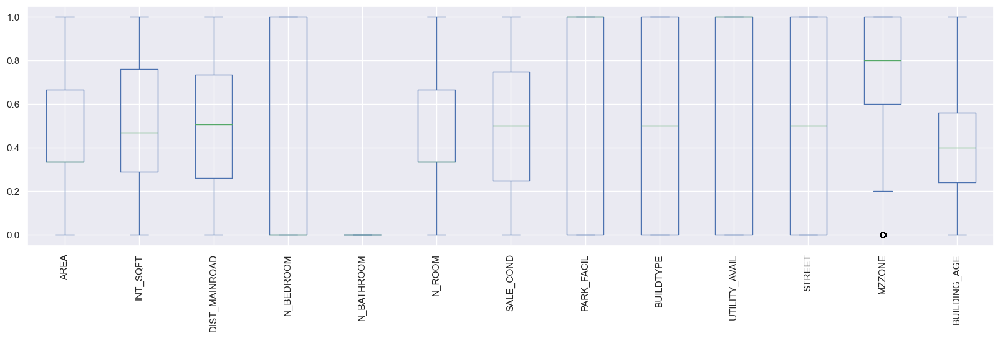

In [53]:
# performing MinMax scaling
mms = MinMaxScaler().fit(X_train)
X_train_mm = mms.transform(X_train)
X_train_mm = pd.DataFrame(X_train_mm, columns=X_train.columns)
X_test_mm = mms.transform(X_test)
X_test_mm = pd.DataFrame(X_test_mm, columns=X_test.columns)
X_train_mm.plot.box(figsize=(20,5), rot=90)
mlt.show()

# Model Selection

### Linear Regression Model

In [54]:
## create an instance of the class LinearRegression, which will represent the regression model:
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train,y_train)
r_sq = lr_model.score(X_train,y_train)

print('coefficient of determination:', r_sq)
print('\nintercept:', lr_model.intercept_)
print('\nslope:', lr_model.coef_)

y_pred = lr_model.predict(X_test)

from math import sqrt

print("\nMAE = ", mean_absolute_error(y_test,y_pred))
print("\nMSE = ", mean_squared_error(y_test,y_pred))
print("\nR2 Value = ", r2_score(y_test,y_pred))
print("\nAdjusted R2 = ", 1 - (1-lr_model.score(x, y))*(len(y)-1)/(len(y)-x.shape[1]-1))

coefficient of determination: 0.8017796157054885

intercept: 2916730.3068993045

slope: [-2.82047521e+05  4.63270826e+03  6.15550414e+02 -1.31945286e+06
 -6.98491931e-10  1.37609203e+06 -9.49195830e+04  1.07111053e+06
 -1.91577397e+06 -1.35523747e+05 -2.67147973e+05  7.06092376e+05
 -1.86875112e+04]

MAE =  1409461.96743861

MSE =  3055620071174.93

R2 Value =  0.7830671085758614

Adjusted R2 =  0.7973613617459444


### Decision tree Regression model

In [55]:
from sklearn.tree import DecisionTreeRegressor

dt_model = DecisionTreeRegressor()
dt_model.fit(X_train,y_train)
dt_pred = dt_model.predict(X_test)

rmse = sqrt(mean_squared_error(y_test,dt_pred))

print("MAE = ", mean_absolute_error(y_test,dt_pred))
print("MSE = ", mean_squared_error(y_test,dt_pred))
print("RMSE = ", rmse)
print("R2 Value = ", r2_score(y_test,dt_pred))

MAE =  573247.6521739131
MSE =  514957263039.7826
RMSE =  717605.2278514856
R2 Value =  0.963440753290992


### Random Forest Regression Model

In [56]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor()
rf_model.fit(X_train,y_train)
rf_pred = rf_model.predict(X_test)

rmse = sqrt(mean_squared_error(y_test,rf_pred))

print("MAE = ", mean_absolute_error(y_test,rf_pred))
print("MSE = ", mean_squared_error(y_test,rf_pred))
print("RMSE = ", rmse)
print("R2 Value = ", r2_score(y_test,rf_pred))

MAE =  425280.1360144928
MSE =  288620557720.6198
RMSE =  537234.1740066615
R2 Value =  0.9795094643141591


* From the above model since R2 value for Random Forest Regression Model is closer to 1 it is taken as the best model.